# RynnBrain Inference Recipes

## Section 9: Thinking with Time & Space

In this section, we demonstrate RynnBrain's **Thinking** capability - an interleaved reasoning mechanism that alternates between textual reasoning and spatial grounding. Unlike conventional purely textual reasoning paradigms, RynnBrain's Thinking version ensures that its reasoning processes are firmly rooted in the physical environment.

### Key Capabilities Demonstrated:
1. **Trajectory Prediction with Thinking**: The model reasons about motion patterns across frames before predicting trajectory points
2. **Affordance Prediction with Thinking**: The model analyzes object properties and interaction possibilities before identifying manipulation points
3. **Area Prediction with Thinking**: The model understands spatial context before locating target regions

### Output Format:
The Thinking version outputs reasoning followed by `####` marker and structured spatial outputs:
```
[Reasoning process about the visual content...]
#### <answer><trajectory/affordance/area><frame i> (X_1, Y_1), (X_2, Y_2), ... </trajectory/affordance/area></answer>
```
- Reasoning appears before `####`
- Answer is wrapped in `<answer>` tags
- Coordinates are normalized to 0-1000 range

### [Setup] Load visualization utils

In [79]:
import os
ROOT_PATH = ""  # set the path to the cookbooks directory
assert ROOT_PATH != "", "Please set ROOT_PATH to the cookbooks directory."
os.chdir(ROOT_PATH)

import glob
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Image as IPyImage, Markdown
import io
import re
import cv2
import numpy as np
import torch
from typing import List, Tuple, Optional

def split_at_middle_space(text, first_line_ratio=0.51):
    """Split text at nearest space to target ratio for better display"""
    text = text.strip()
    space_positions = [i for i, char in enumerate(text) if char == ' ']
    
    if not space_positions:
        return text
    
    target_pos = int(len(text) * first_line_ratio)
    split_pos = min(space_positions, key=lambda x: abs(x - target_pos))
    
    first_line = text[:split_pos].strip()
    second_line = text[split_pos:].strip()
    
    return f"{first_line}\n{second_line}"


def add_frame_id(conversation):
    """Add frame identifiers to image content in conversations"""
    for message in conversation:
        if message["role"] == "user":
            image_idx = 0
            new_contents = []
            for i, content in enumerate(message["content"]):
                if content["type"] == "image":
                    new_contents.append({"type": "text", "text": f"<frame {image_idx}>: "})
                    image_idx += 1
                new_contents.append(content)
            message["content"] = new_contents
    return conversation


def show_images_grid(
    img_dir,
    n=8,
    cols=4,
    figsize_per_cell=(4, 4),
    exts=("png", "jpg", "jpeg", "bmp", "webp"),
    sort=True,
    show_title=True,
    keep_axis=True,
):
    """Display images from directory in a grid layout"""
    patterns = [os.path.join(img_dir, f"*.{e}") for e in exts]
    paths = []
    for pat in patterns:
        paths.extend(glob.glob(pat))
    if sort:
        paths = sorted(paths)

    paths = paths[:n]
    if len(paths) == 0:
        raise FileNotFoundError(f"No images found in {img_dir} with extensions {exts}")

    rows = (len(paths) + cols - 1) // cols
    fig_w = figsize_per_cell[0] * cols
    fig_h = figsize_per_cell[1] * rows
    fig, axes = plt.subplots(rows, cols, figsize=(fig_w, fig_h), squeeze=False, dpi=108)

    for i, ax in enumerate(axes.flat):
        if i < len(paths):
            p = paths[i]
            img = Image.open(p)
            ax.imshow(img)

            if show_title:
                ax.set_title(os.path.basename(p), fontsize=10)

            if keep_axis:
                ax.tick_params(labelsize=8)
            else:
                ax.axis("off")
        else:
            ax.axis("off")

    plt.tight_layout()
    plt.show()


def convert_points_to_raw(points_norm, width, height):
    """Convert normalized coordinates (0-1000) to pixel coordinates"""
    point_list = []
    for point in points_norm:
        x_norm, y_norm = point[0], point[1]
        x = round(x_norm / 1000 * width)
        y = round(y_norm / 1000 * height)
        point_list.append((x, y))
    return point_list


def parse_frame_id_and_points(output_text: str) -> Tuple[Optional[int], List[Tuple[int, int]]]:
    """Parse frame ID and coordinate points from model output"""
    try:
        frame_match = re.search(r'frame (\d+)', output_text)
        if not frame_match:
            return None, []
        
        frame_id = int(frame_match.group(1))
        coord_pattern = r'\((\d+),\s*(\d+)\)'
        coord_matches = re.findall(coord_pattern, output_text)
        
        points = []
        for x_str, y_str in coord_matches:
            try:
                x = int(x_str)
                y = int(y_str)
                points.append((x, y))
            except ValueError:
                continue
        
        return frame_id, points
        
    except Exception as e:
        return None, []


def parse_points(output_text: str) -> List[Tuple[int, int]]:
    """Parse coordinate points from model output"""
    try:
        coord_pattern = r'\((\d+),\s*(\d+)\)'
        coord_matches = re.findall(coord_pattern, output_text)
        
        points = []
        for x_str, y_str in coord_matches:
            try:
                x = int(x_str)
                y = int(y_str)
                points.append((x, y))
            except ValueError:
                continue
        
        return points
        
    except Exception as e:
        return []


def parse_thinking_and_output(output_text: str) -> Tuple[str, str]:
    """
    Parse thinking process and final output from model response.
    RL format: reasoning... #### <answer><tag><frame i> coords </tag></answer>
    """
    # Split by #### marker
    if "####" in output_text:
        parts = output_text.split("####", 1)
        thinking = parts[0].strip()
        final_output = "####" + parts[1].strip() if len(parts) > 1 else ""
    else:
        thinking = ""
        final_output = output_text.strip()
    
    return thinking, final_output


def display_thinking_output(output_text: str):
    """Display thinking process and final output in formatted manner"""
    thinking, final_output = parse_thinking_and_output(output_text)
    
    if thinking:
        display(Markdown("**🧠 Thinking Process:**"))
        display(Markdown(f"```\n{thinking}\n```"))
    
    display(Markdown("**📍 Spatial Output:**"))
    display(Markdown(f"```\n{final_output}\n```"))


def parse_answer_output(output_text: str, tag: str) -> Tuple[Optional[int], List[Tuple[int, int]]]:
    """
    Parse answer from RL format output.
    Format: #### <answer><tag><frame i> (X_1, Y_1), ... </tag></answer>
    """
    try:
        # Match the answer pattern
        pattern = rf'<answer>\s*<{tag}>\s*<frame\s+(\d+)>\s*(.*?)\s*</{tag}>\s*</answer>'
        match = re.search(pattern, output_text, re.DOTALL | re.IGNORECASE)
        
        if not match:
            # Try without answer tags
            pattern = rf'<{tag}>\s*<frame\s+(\d+)>\s*(.*?)\s*</{tag}>'
            match = re.search(pattern, output_text, re.DOTALL | re.IGNORECASE)
        
        if not match:
            return None, []
        
        frame_id = int(match.group(1))
        coords_str = match.group(2)
        
        # Parse coordinates
        coord_pattern = r'\((\d+),\s*(\d+)\)'
        coord_matches = re.findall(coord_pattern, coords_str)
        
        points = [(int(x), int(y)) for x, y in coord_matches]
        
        return frame_id, points
        
    except Exception as e:
        return None, []


def draw_points_on_image(img, points, color="red", point_radius=6, width=4, show_width=400, text=None):
    """Draw points on image and display"""
    w, h = img.size
    draw = ImageDraw.Draw(img)

    for point in points:
        x, y = point
        draw.ellipse([x-point_radius, y-point_radius, x+point_radius, y+point_radius], 
                    outline=color, width=width, fill=color)
    
    if text:
        if isinstance(text, list):
            text = "\n".join(text)
        text = split_at_middle_space(text)
        
        if points:
            xs = [p[0] for p in points]
            ys = [p[1] for p in points]
            min_x, max_x = min(xs), max(xs)
            min_y, max_y = min(ys), max(ys)
            
            points_bbox_width_shift = 0.1*w
            points_bbox_width = max_x - min_x + points_bbox_width_shift 
            text_length = len(text)
            min_fontsize = 10
            max_fontsize = 40
            
            if points_bbox_width > 0:
                fontsize = max(min_fontsize, min(max_fontsize, int(points_bbox_width / max(1, text_length * 0.07))))
            else:
                fontsize = 12  
        else:
            min_x, min_y = 10, 10  
            fontsize = 12
        
        font = ImageFont.truetype("assets/arial.ttf", fontsize)
        
        try:
            bbox_text = draw.textbbox((0, 0), text, font)
        except:
            bbox_text = draw.textsize(text, font)
            bbox_text = (0, 0, bbox_text[0], bbox_text[1])
        
        text_width = bbox_text[2] - bbox_text[0]
        text_height = bbox_text[3] - bbox_text[1]
        
        padding = 10
        text_x = max(min(max_x + 3 * padding, w - text_width - padding), padding)
        text_y = max(min(min_y - text_height - padding, h - text_height - padding), padding)
        
        if text_y < padding:
            text_y = min(max_y + padding, h - text_height - padding)
        
        background_rect = [
            text_x - padding, text_y - padding,
            text_x + text_width + padding, text_y + text_height + 3 * padding
        ]
        draw.rectangle(background_rect, fill=color)
        draw.text((text_x, text_y), text, fill="white", font=font)
    
    buf = io.BytesIO()
    img.save(buf, format="PNG")
    buf.seek(0)
    display(IPyImage(data=buf.getvalue(), width=show_width))


def draw_trajectory_on_image(img, points, color="blue", line_width=3, point_radius=5, show_width=600, text=None):
    """Draw trajectory (connected points) on image"""
    w, h = img.size
    draw = ImageDraw.Draw(img)
    
    # Draw lines connecting consecutive points
    if len(points) > 1:
        for i in range(len(points) - 1):
            draw.line([points[i], points[i+1]], fill=color, width=line_width)
    
    # Draw points with markers for start/end
    for i, point in enumerate(points):
        x, y = point
        if i == 0:  # Start point - green
            draw.ellipse([x-point_radius-2, y-point_radius-2, x+point_radius+2, y+point_radius+2], 
                        outline="green", width=3, fill="green")
        elif i == len(points) - 1:  # End point - red
            draw.ellipse([x-point_radius-2, y-point_radius-2, x+point_radius+2, y+point_radius+2], 
                        outline="red", width=3, fill="red")
        else:  # Intermediate points
            draw.ellipse([x-point_radius, y-point_radius, x+point_radius, y+point_radius], 
                        outline=color, width=2, fill=color)
    
    if text:
        if isinstance(text, list):
            text = "\n".join(text)
        text = split_at_middle_space(text)
        fontsize = 14
        font = ImageFont.truetype("assets/arial.ttf", fontsize)
        
        padding = 10
        try:
            bbox_text = draw.textbbox((0, 0), text, font)
        except:
            bbox_text = draw.textsize(text, font)
            bbox_text = (0, 0, bbox_text[0], bbox_text[1])
        
        text_width = bbox_text[2] - bbox_text[0]
        text_height = bbox_text[3] - bbox_text[1]
        
        text_x = padding
        text_y = padding
        
        background_rect = [
            text_x - padding//2, text_y - padding//2,
            text_x + text_width + padding, text_y + text_height + padding
        ]
        draw.rectangle(background_rect, fill=color)
        draw.text((text_x, text_y), text, fill="white", font=font)
    
    buf = io.BytesIO()
    img.save(buf, format="PNG")
    buf.seek(0)
    display(IPyImage(data=buf.getvalue(), width=show_width))

print("✅ Visualization utilities loaded successfully!")

✅ Visualization utilities loaded successfully!


### [General] Load Model and Processor

We load the RynnBrain **Thinking** version model, which has been trained with interleaved reasoning capabilities.

In [80]:
from pathlib import Path
from transformers import AutoModelForImageTextToText, AutoProcessor

model_path = ""  # set the path to RynnBrain-Thinking model
model = AutoModelForImageTextToText.from_pretrained(model_path, torch_dtype=torch.bfloat16, device_map="auto", attn_implementation="flash_attention_2")
processor = AutoProcessor.from_pretrained(model_path)
print(f"✅ Model loaded")

# System prompts for different task types
SYSTEM_PROMPTS = {
    "trajectory": "You are an embodied agent. You are given a video to solve a trajectory prediction problem.",
    "affordance": "You are an embodied agent. You are given a video to solve an affordance prediction problem.",
    "area": "You are an embodied agent. You are given a video to solve an area prediction problem.",
}


exts = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

Loading checkpoint shards: 100%|██████████| 4/4 [00:05<00:00,  1.49s/it]


✅ Model loaded


---
## Part 1: Trajectory Prediction with Thinking

Trajectory prediction requires the model to understand motion patterns and spatial relationships across time. The Thinking version explicitly reasons about:
- Object motion direction and velocity
- Temporal consistency across frames
- Physical constraints and obstacles

### Video Example: Predicting object trajectory

#### 1. Load and visualize the video frames

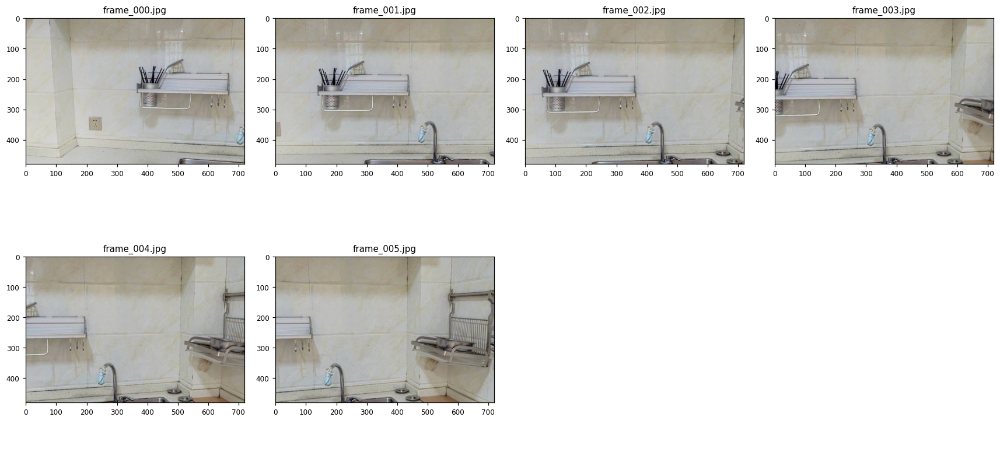

In [81]:
VIDEO_PATH = "assets/trajectory_location/videos/0"
show_images_grid(VIDEO_PATH, n=8, cols=4)

#### 2. Generate messages with RL format prompt

The RL format prompt instructs the model to first predict the key frame, then output coordinates. The model will reason step-by-step before providing the answer after `####`.

In [82]:


img_paths = sorted(
    [os.path.join(VIDEO_PATH, f) for f in os.listdir(VIDEO_PATH)
     if os.path.splitext(f)[1].lower() in exts]
)

content = []
for p in img_paths:
    content.append({"type": "image", "image": str(p)})

# Task instruction
instruction = "Move the black chopsticks from the container on the left to the metal rack on the right."

# RL format prompt (from preprocess_rl.py)
format_prompt = """
First predict the frame containing the trajectory start point, then output up to 10 key trajectory points as a list of tuples.
Output format: `#### <answer><trajectory><frame i> (X_1, Y_1), (X_2, Y_2), ..., (X_N, Y_N) </trajectory></answer>`. Coordinates normalized to 0-1000."""

content.append({"type": "text", "text": f"{instruction}{format_prompt}"})

messages = [
    {
        "role": "system",
        "content": [{"type": "text", "text": SYSTEM_PROMPTS["trajectory"]}]
    },
    {
        "role": "user",
        "content": content
    }
]
messages = add_frame_id(messages)
print(f"Messages prepared for trajectory prediction with thinking! {messages}")

Messages prepared for trajectory prediction with thinking! [{'role': 'system', 'content': [{'type': 'text', 'text': 'You are an embodied agent. You are given a video to solve a trajectory prediction problem.'}]}, {'role': 'user', 'content': [{'type': 'text', 'text': '<frame 0>: '}, {'type': 'image', 'image': 'assets/trajectory_location/videos/0/frame_000.jpg'}, {'type': 'text', 'text': '<frame 1>: '}, {'type': 'image', 'image': 'assets/trajectory_location/videos/0/frame_001.jpg'}, {'type': 'text', 'text': '<frame 2>: '}, {'type': 'image', 'image': 'assets/trajectory_location/videos/0/frame_002.jpg'}, {'type': 'text', 'text': '<frame 3>: '}, {'type': 'image', 'image': 'assets/trajectory_location/videos/0/frame_003.jpg'}, {'type': 'text', 'text': '<frame 4>: '}, {'type': 'image', 'image': 'assets/trajectory_location/videos/0/frame_004.jpg'}, {'type': 'text', 'text': '<frame 5>: '}, {'type': 'image', 'image': 'assets/trajectory_location/videos/0/frame_005.jpg'}, {'type': 'text', 'text': '

#### 3. Infer with RynnBrain (Thinking Mode)

In [83]:
inputs = processor.apply_chat_template(
    messages,
    tokenize=True,
    add_generation_prompt=True,
    return_dict=True,
    return_tensors="pt"
)
inputs = inputs.to(model.device)

# Inference with extended max tokens to accommodate thinking
generated_ids = model.generate(**inputs, max_new_tokens=512)
generated_ids_trimmed = [
    out_ids[len(in_ids):] for in_ids, out_ids in zip(inputs.input_ids, generated_ids)
]
output_text_trajectory = processor.batch_decode(
    generated_ids_trimmed, skip_special_tokens=True, clean_up_tokenization_spaces=False
)[0]

print("=" * 60)
print("Model Output (Trajectory Prediction with Thinking):")
print("=" * 60)
display_thinking_output(output_text_trajectory)

Model Output (Trajectory Prediction with Thinking):


**🧠 Thinking Process:**

```
<think>First, I must parse the user's instruction. The command is to 'move' the 'black chopsticks' from the 'container on the left' to the 'metal rack on the right'.This requires picking up the specified chopsticks and placing them in the rack. The starting point of the trajectory is the object being moved, which are the [black chopsticks] <object> <frame 2> ((81, 352), (206, 470)) </object> located inside the [container on the left] <area> <frame 2> (129, 491), (154, 550), (154, 516) </area>.The destination is the target location, which is the [metal rack on the right] <area> <frame 5> (834, 695), (934, 733), (736, 572) </area>.Therefore, the trajectory originates from the [black chopsticks] <object> <frame 2> ((81, 352), (206, 470)) </object>, moves upwards and to the right, and terminates on the [metal rack on the right] <area> <frame 5> (834, 695), (934, 733), (736, 572) </area>.</think>
```

**📍 Spatial Output:**

```
####<answer><trajectory><frame 2>, (258, 404), (306, 354), (413, 406), (501, 465)</trajectory></answer>
```

#### 4. Visualization

The trajectory is visualized with:
- 🟢 **Green**: Start point
- 🔵 **Blue**: Intermediate points and path
- 🔴 **Red**: End point

Frame: 2, Trajectory Points: 4


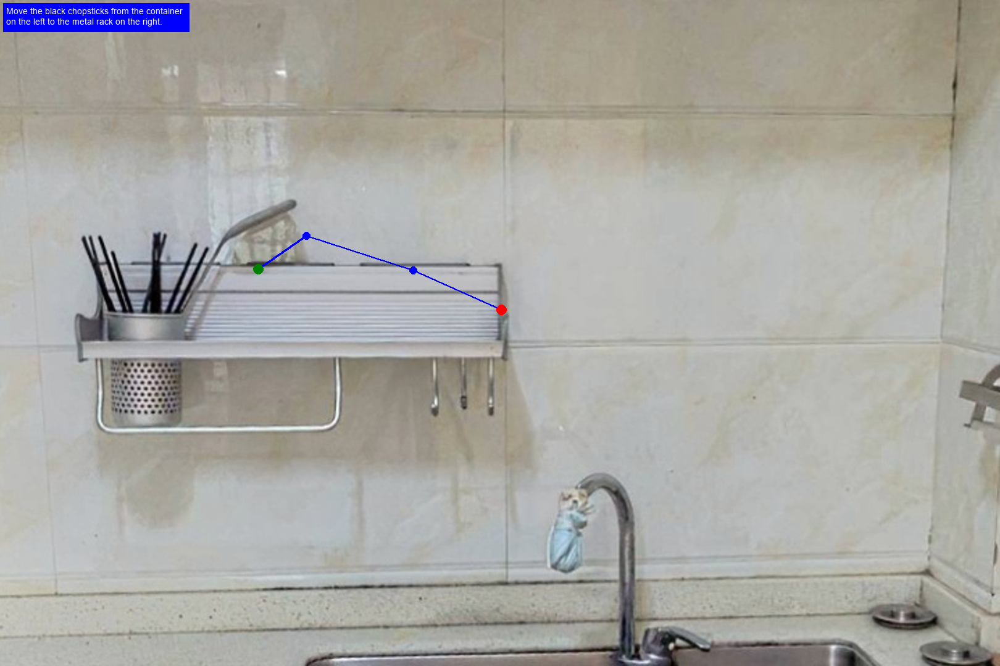

In [84]:
# Parse and visualize trajectory using RL format parser
frame_id, points = parse_answer_output(output_text_trajectory, "trajectory")

# Fallback to general parser if RL format not matched
if frame_id is None:
    _, final_output = parse_thinking_and_output(output_text_trajectory)
    frame_id, points = parse_frame_id_and_points(final_output)

if frame_id is not None and points:
    img_path = img_paths[frame_id]
    img = Image.open(img_path).convert("RGB")
    img = img.resize((int(1080 * img.size[0] / img.size[1]), 1080))
    w, h = img.size
    points_raw = convert_points_to_raw(points, w, h)
    
    print(f"Frame: {frame_id}, Trajectory Points: {len(points)}")
    draw_trajectory_on_image(img, points_raw, color="blue", line_width=3, 
                             point_radius=6, show_width=600, text=instruction)
else:
    print("Could not parse trajectory from output. Showing raw output:")
    print(output_text_trajectory)

---
## Part 2: Affordance Prediction with Thinking

Affordance prediction identifies where and how objects can be manipulated. The Thinking version reasons about:
- Object properties and physical characteristics
- Manipulation possibilities (grasp points, push points, etc.)
- Context-aware interaction points

### Video Example: Finding manipulation points

#### 1. Load and visualize the video frames

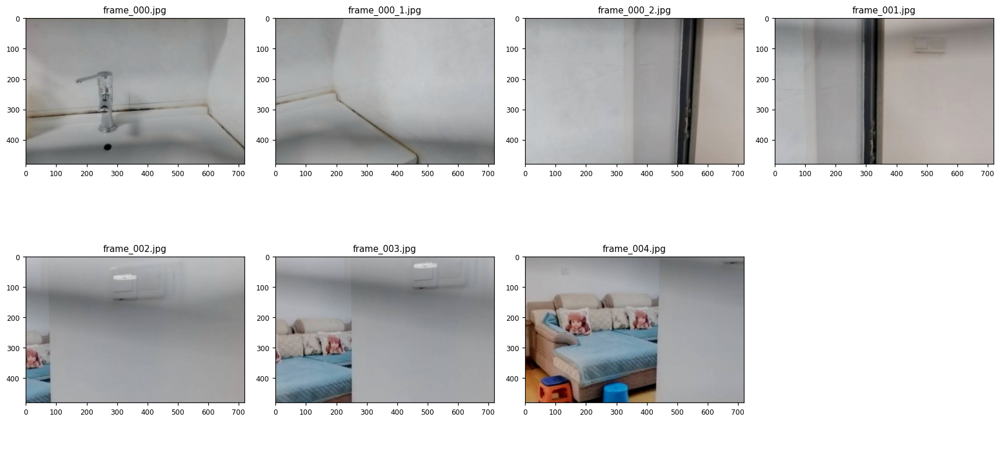

In [85]:
VIDEO_PATH_AFFORDANCE = "assets/affordance_location/videos/0"
show_images_grid(VIDEO_PATH_AFFORDANCE, n=7, cols=4)

#### 2. Generate messages with thinking prompt for affordance

In [86]:
img_paths_affordance = sorted(
    [os.path.join(VIDEO_PATH_AFFORDANCE, f) for f in os.listdir(VIDEO_PATH_AFFORDANCE)
     if os.path.splitext(f)[1].lower() in exts]
)

content = []
for p in img_paths_affordance:
    content.append({"type": "image", "image": str(p)})

# Task instruction
instruction = "Lift the patterned pillow on the far left of the sofa."

# RL format prompt (from preprocess_rl.py)
format_prompt = """
First predict the key frame, then output a single affordance point as coordinates (x, y).
Output format: `#### <answer><affordance><frame i> (X, Y) </affordance></answer>`. Coordinates normalized to 0-1000."""

content.append({"type": "text", "text": f"{instruction}{format_prompt}"})

messages_affordance = [
    {
        "role": "system",
        "content": [{"type": "text", "text": SYSTEM_PROMPTS["affordance"]}]
    },
    {
        "role": "user",
        "content": content
    }
]
messages_affordance = add_frame_id(messages_affordance)
print("Messages prepared for affordance prediction with thinking!")

Messages prepared for affordance prediction with thinking!


#### 3. Infer with RynnBrain (Thinking Mode)

In [87]:
inputs = processor.apply_chat_template(
    messages_affordance,
    tokenize=True,
    add_generation_prompt=True,
    return_dict=True,
    return_tensors="pt"
)
inputs = inputs.to(model.device)

generated_ids = model.generate(**inputs, max_new_tokens=512)
generated_ids_trimmed = [
    out_ids[len(in_ids):] for in_ids, out_ids in zip(inputs.input_ids, generated_ids)
]
output_text_affordance = processor.batch_decode(
    generated_ids_trimmed, skip_special_tokens=True, clean_up_tokenization_spaces=False
)[0]

print("=" * 60)
print("Model Output (Affordance Prediction with Thinking):")
print("=" * 60)
display_thinking_output(output_text_affordance)

Model Output (Affordance Prediction with Thinking):


**🧠 Thinking Process:**

```
<think>I first locate the main object, the [sofa] <area> <frame 7> (940, 939), (559, 612), (806, 808), (530, 681) </area>, which is the large piece of furniture in the center of the image.Next, I scan the [sofa] <area> <frame 7> (940, 939), (559, 612), (806, 808), (530, 681) </area> to find the target object, a 'patterned pillow'. I identify two [patterned pillows] <object> <frame 7> ((213, 185), (480, 489)) </object> with cartoon faces on the [sofa] <area> <frame 7> (940, 939), (559, 612), (806, 808), (530, 681) </area>.The instruction specifies the one 'on the far left', so I select the [pillow on the far left] <object> <frame 7> ((213, 185), (480, 489)) </object>.The required action is 'lift'. To lift a soft object like a pillow, the most effective way is to grasp its main body.Therefore, the final affordance prediction is placed on the surface of the [patterned pillow on the far left] <object> <frame 7> ((213, 185), (480, 489)) </object>.</think>
```

**📍 Spatial Output:**

```
####<answer><affordance><frame 7>, (347, 369)</affordance></answer>
```

#### 4. Visualization

The affordance point shows the optimal manipulation location identified by the model.

Frame: 7, Affordance Points: 1


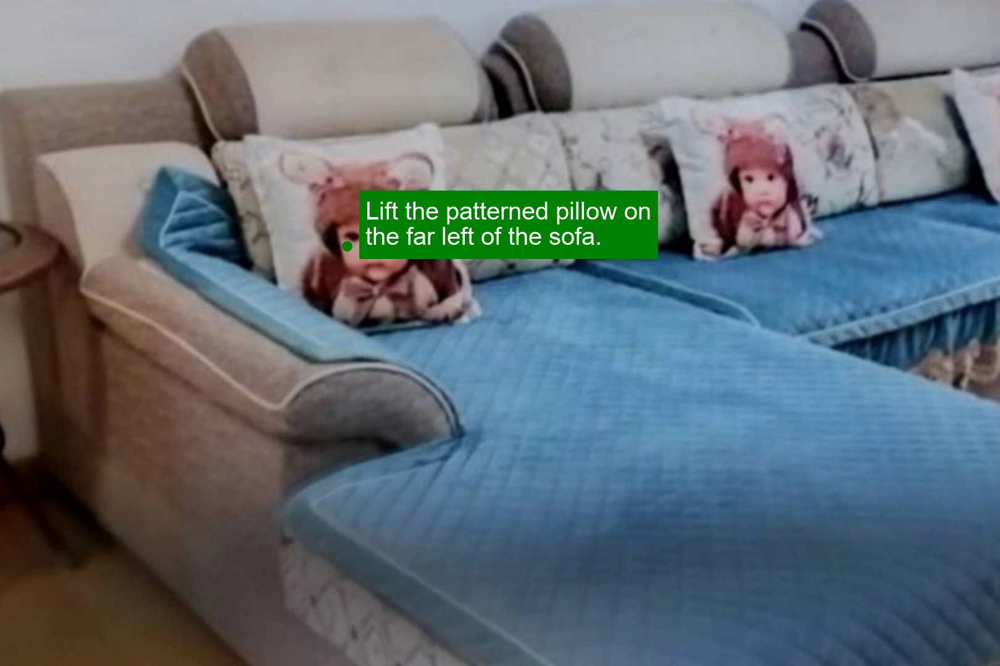

In [88]:
# Parse and visualize affordance point using RL format parser
frame_id, points = parse_answer_output(output_text_affordance, "affordance")

# Fallback to general parser if RL format not matched
if frame_id is None:
    _, final_output = parse_thinking_and_output(output_text_affordance)
    frame_id, points = parse_frame_id_and_points(final_output)

if frame_id is not None and points:
    img_path = img_paths_affordance[frame_id]
    img = Image.open(img_path).convert("RGB")
    img = img.resize((int(1080 * img.size[0] / img.size[1]), 1080))
    w, h = img.size
    points_raw = convert_points_to_raw(points, w, h)
    
    print(f"Frame: {frame_id}, Affordance Points: {len(points)}")
    draw_points_on_image(img, points_raw, color="green", point_radius=8, 
                         width=4, show_width=600, text=instruction)
else:
    print("Could not parse affordance from output. Showing raw output:")
    print(output_text_affordance)

---
## Part 3: Area Prediction with Thinking

Area prediction identifies regions in the scene based on semantic understanding. The Thinking version reasons about:
- Spatial layout and object relationships
- Semantic understanding of areas (e.g., "vacant space", "workspace")
- Boundary determination based on context

### Video Example: Finding vacant areas

#### 1. Load and visualize the video frames

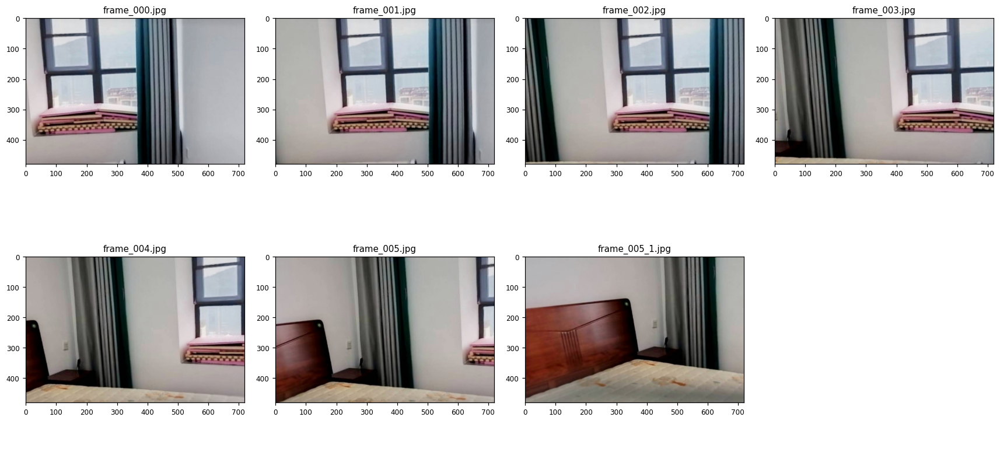

In [89]:
VIDEO_PATH_AREA = "assets/area_location/videos/0"
show_images_grid(VIDEO_PATH_AREA, n=7, cols=4)

#### 2. Generate messages with thinking prompt for area prediction

In [90]:
img_paths_area = sorted(
    [os.path.join(VIDEO_PATH_AREA, f) for f in os.listdir(VIDEO_PATH_AREA)
     if os.path.splitext(f)[1].lower() in exts]
)

content = []
for p in img_paths_area:
    content.append({"type": "image", "image": str(p)})

# Task instruction
instruction = "Find several locations on the vacant section of the dark brown nightstand beside the bed."

# RL format prompt (from preprocess_rl.py)
format_prompt = """
First predict the key frame, then output coordinates as a series of tuples.
Output format: `#### <answer><area><frame i> (X_1, Y_1), ... </area></answer>`. Coordinates normalized to 0-1000."""

content.append({"type": "text", "text": f"{instruction}{format_prompt}"})

messages_area = [
    {
        "role": "system",
        "content": [{"type": "text", "text": SYSTEM_PROMPTS["area"]}]
    },
    {
        "role": "user",
        "content": content
    }
]
messages_area = add_frame_id(messages_area)
print(f"Messages prepared for area prediction with thinking! {messages_area}")

Messages prepared for area prediction with thinking! [{'role': 'system', 'content': [{'type': 'text', 'text': 'You are an embodied agent. You are given a video to solve an area prediction problem.'}]}, {'role': 'user', 'content': [{'type': 'text', 'text': '<frame 0>: '}, {'type': 'image', 'image': 'assets/area_location/videos/0/frame_000.jpg'}, {'type': 'text', 'text': '<frame 1>: '}, {'type': 'image', 'image': 'assets/area_location/videos/0/frame_001.jpg'}, {'type': 'text', 'text': '<frame 2>: '}, {'type': 'image', 'image': 'assets/area_location/videos/0/frame_002.jpg'}, {'type': 'text', 'text': '<frame 3>: '}, {'type': 'image', 'image': 'assets/area_location/videos/0/frame_003.jpg'}, {'type': 'text', 'text': '<frame 4>: '}, {'type': 'image', 'image': 'assets/area_location/videos/0/frame_004.jpg'}, {'type': 'text', 'text': '<frame 5>: '}, {'type': 'image', 'image': 'assets/area_location/videos/0/frame_005.jpg'}, {'type': 'text', 'text': '<frame 6>: '}, {'type': 'image', 'image': 'asse

#### 3. Infer with RynnBrain (Thinking Mode)

In [91]:
inputs = processor.apply_chat_template(
    messages_area,
    tokenize=True,
    add_generation_prompt=True,
    return_dict=True,
    return_tensors="pt"
)
inputs = inputs.to(model.device)

generated_ids = model.generate(**inputs, max_new_tokens=512)
generated_ids_trimmed = [
    out_ids[len(in_ids):] for in_ids, out_ids in zip(inputs.input_ids, generated_ids)
]
output_text_area = processor.batch_decode(
    generated_ids_trimmed, skip_special_tokens=True, clean_up_tokenization_spaces=False
)[0]

print("=" * 60)
print("Model Output (Area Prediction with Thinking):")
print("=" * 60)
display_thinking_output(output_text_area)

Model Output (Area Prediction with Thinking):


**🧠 Thinking Process:**

```
<think></think>
```

**📍 Spatial Output:**

```
####<answer><area><frame 5>, (356, 815), (362, 808), (368, 812)</area></answer>
```

#### 4. Visualization

Multiple points define the boundaries of the identified vacant area.

Frame: 5, Area Points: 3


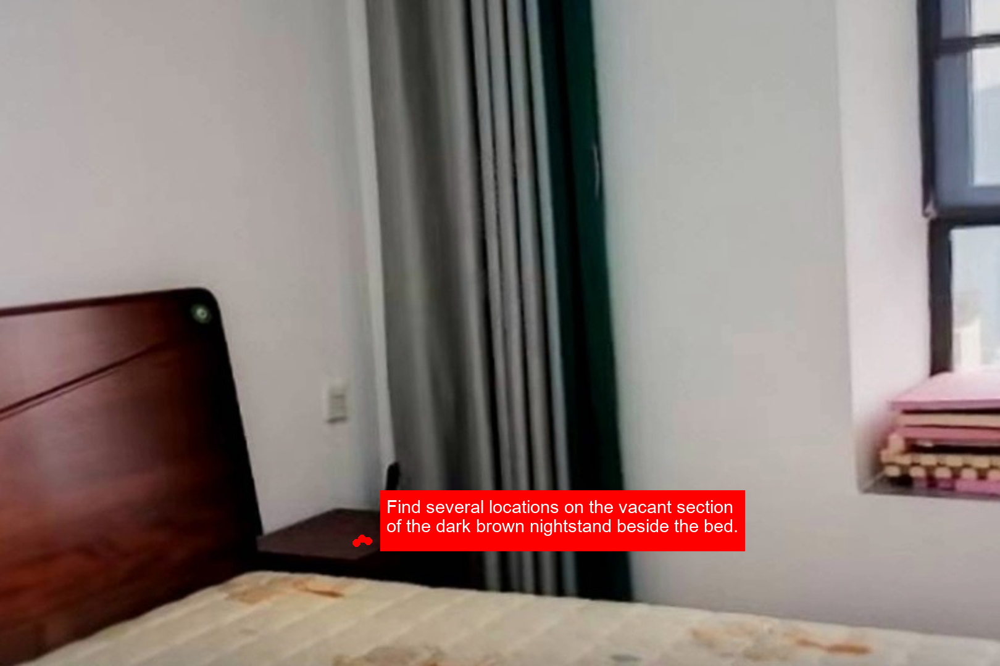

In [92]:
# Parse and visualize area points using RL format parser
frame_id, points = parse_answer_output(output_text_area, "area")

# Fallback to general parser if RL format not matched
if frame_id is None:
    _, final_output = parse_thinking_and_output(output_text_area)
    frame_id, points = parse_frame_id_and_points(final_output)

if frame_id is not None and points:
    img_path = img_paths_area[frame_id]
    img = Image.open(img_path).convert("RGB")
    img = img.resize((int(1080 * img.size[0] / img.size[1]), 1080))
    w, h = img.size
    points_raw = convert_points_to_raw(points, w, h)
    
    print(f"Frame: {frame_id}, Area Points: {len(points)}")
    draw_points_on_image(img, points_raw, color="red", point_radius=6, 
                         width=4, show_width=600, text=instruction)
else:
    print("Could not parse area from output. Showing raw output:")
    print(output_text_area)

---
## Part 4: Single Image Thinking Examples

The Thinking capability also works on single images, demonstrating spatial reasoning without temporal context.

### Image Example: Affordance on single image

#### 1. Generate messages for single image affordance

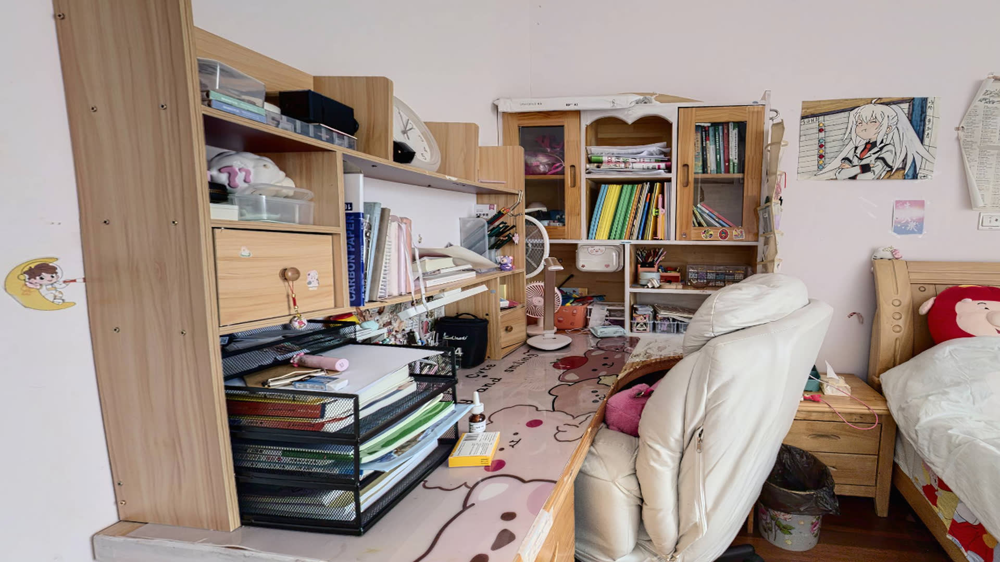

Messages prepared for single image affordance prediction!


In [93]:
image_path = "assets/area_location/images/Snipaste_2025-03-06_11-04-32.jpg"

# Display the image
img_display = Image.open(image_path)
buf = io.BytesIO()
img_display.save(buf, format="PNG")
buf.seek(0)
display(IPyImage(data=buf.getvalue(), width=500))

content = []
content.append({"type": "image", "image": image_path})

# Task instruction
instruction = "Open the left cabinet door."

# RL format prompt for single image (no frame prediction needed)
format_prompt = """
Output a single affordance point as coordinates (x, y).
Output format: `#### <answer><affordance> (X, Y) </affordance></answer>`. Coordinates normalized to 0-1000."""

content.append({"type": "text", "text": f"{instruction}{format_prompt}"})

messages_single = [
    {
        "role": "system",
        "content": [{"type": "text", "text": SYSTEM_PROMPTS["affordance"]}]
    },
    {
        "role": "user",
        "content": content
    }
]
messages_area = add_frame_id(messages_area)
print("Messages prepared for single image affordance prediction!")

#### 2. Infer with RynnBrain (Thinking Mode)

In [94]:
inputs = processor.apply_chat_template(
    messages_single,
    tokenize=True,
    add_generation_prompt=True,
    return_dict=True,
    return_tensors="pt"
)
inputs = inputs.to(model.device)

generated_ids = model.generate(**inputs, max_new_tokens=512)
generated_ids_trimmed = [
    out_ids[len(in_ids):] for in_ids, out_ids in zip(inputs.input_ids, generated_ids)
]
output_text_single = processor.batch_decode(
    generated_ids_trimmed, skip_special_tokens=True, clean_up_tokenization_spaces=False
)[0]

print("=" * 60)
print("Model Output (Single Image Affordance with Thinking):")
print("=" * 60)
display_thinking_output(output_text_single)

Model Output (Single Image Affordance with Thinking):


**🧠 Thinking Process:**

```
<think>First, I need to locate the 'left cabinet door'. In the image, there is a large wooden cabinet. I will focus on the [left side of the cabinet] <area> <object> <frame> (498, 202), (582, 421) </object>. This section consists of two doors. The instruction specifies the 'left cabinet door', so I will select the [left door] <area> <object> <frame> (516, 215), (566, 321) </object> of the two. Since the required action is 'open', the logical interaction point for this action is the [handle] <area> <object> <frame> (573, 294), (578, 327) </object> on the [left cabinet door] <area> <object> <frame> (516, 215), (566, 321) </object>. Therefore, the final affordance prediction is placed on the [handle] <area> <object> <frame> (573, 294), (578, 327) </object>.</think>
```

**📍 Spatial Output:**

```
####<answer><affordance> (570, 307), (570, 306), (570, 307)</affordance></answer>
```

#### 3. Visualization

Affordance Points: 3


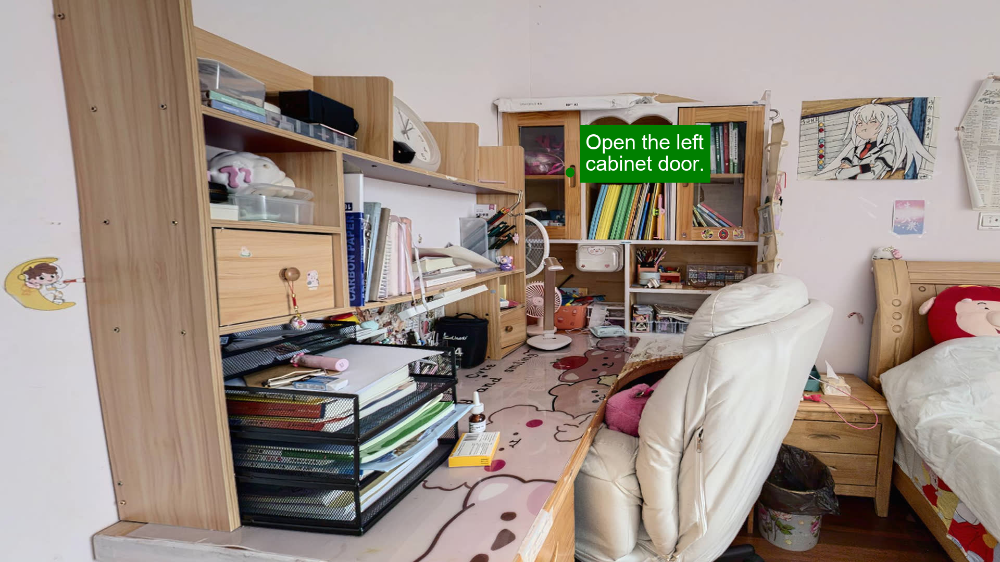

In [95]:
# Parse and visualize single image affordance
# For single image, there's no frame id, just parse the points
_, final_output = parse_thinking_and_output(output_text_single)

# Try to parse from answer format first
pattern = r'<answer>\s*<affordance>\s*(.*?)\s*</affordance>\s*</answer>'
match = re.search(pattern, final_output, re.DOTALL | re.IGNORECASE)

if match:
    coords_str = match.group(1)
    coord_pattern = r'\((\d+),\s*(\d+)\)'
    coord_matches = re.findall(coord_pattern, coords_str)
    points = [(int(x), int(y)) for x, y in coord_matches]
else:
    points = parse_points(final_output)

if points:
    image = Image.open(image_path).convert("RGB")
    image = image.resize((int(1080 * image.size[0] / image.size[1]), 1080))
    w, h = image.size
    points_raw = convert_points_to_raw(points, w, h)
    
    print(f"Affordance Points: {len(points)}")
    draw_points_on_image(image, points_raw, color="green", point_radius=8, 
                         width=4, show_width=600, text=instruction)
else:
    print("Could not parse affordance from output. Showing raw output:")
    print(output_text_single)

---
## Summary

In this cookbook, we demonstrated RynnBrain's **Thinking with Time & Space** capabilities:

### Key Takeaways:

1. **Interleaved Reasoning**: RynnBrain's Thinking version alternates between textual reasoning and spatial grounding, making its decision process transparent and interpretable.

2. **Trajectory Prediction**: The model can track and predict object/hand movements across video frames by reasoning about motion patterns and temporal consistency.

3. **Affordance Prediction**: By analyzing object properties and context, the model identifies optimal manipulation points for robotic interaction.

4. **Area Prediction**: The model understands semantic regions and can locate areas based on natural language descriptions.

### Thinking Benefits:
- **Interpretability**: The reasoning process is visible before the `####` marker
- **Accuracy**: Step-by-step reasoning often leads to more accurate spatial predictions
- **Robustness**: Explicit reasoning helps handle ambiguous or complex scenes

### Output Format Summary (RL Format):
```
[Step-by-step reasoning about the visual content...]
#### <answer><trajectory/affordance/area><frame i> (X_1, Y_1), (X_2, Y_2), ... </trajectory/affordance/area></answer>
```

**Task-Specific Formats:**
- **Trajectory**: `#### <answer><trajectory><frame i> (X_1, Y_1), ..., (X_N, Y_N) </trajectory></answer>` (up to 10 points)
- **Affordance**: `#### <answer><affordance><frame i> (X, Y) </affordance></answer>` (single point)
- **Area**: `#### <answer><area><frame i> (X_1, Y_1), ... </area></answer>` (multiple points)

All coordinates are normalized to 0-1000 range.

For more examples, please refer to other cookbooks in this series.